# Sentiment Analysis

### Import Dependencies

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

In [25]:
file=('Concat_ML_Data/second_debate.csv')
second_df=pd.read_csv(file)
second_df.head()

,tweet,replies_count,retweets_count,likes_count,candidate,tweet_length,Subjectivity,Polarity,Sentiment
0,Hypothetical Question Let say Joe Biden wins t...,0,0,0,Biden,48,0.287500,0.215625,Positive
1,want the Healthcare fixed,0,0,0,Biden,4,0.200000,0.100000,Positive
2,Joe Biden and Kamala Harris will not let Donal...,0,1,1,Biden,25,0.383333,-0.200000,Negative
3,Apparently thinks being compared to Mister Rog...,0,0,0,Biden,17,0.305000,0.155000,Positive
4,And Joe Biden doesn break the law mon Donkey ...,0,0,3,Biden,10,0.000000,0.000000,Neutral


### Basic Metrics

In [26]:
# Separating entire dataset to sentiments for Trump and Biden
biden_sentiment=second_df[(second_df['candidate']=='Biden')]
trump_sentiment=second_df[(second_df['candidate']=='Trump')]

In [27]:
# Computing sentiment percentages for each candidate
biden_sentiments_by_type=biden_sentiment.groupby(['Sentiment']).count()['tweet']
total_biden_tweets=biden_sentiment.count()['tweet']
biden_sentiment_percents=100*biden_sentiments_by_type/total_biden_tweets

trump_sentiments_by_type=trump_sentiment.groupby(['Sentiment']).count()['tweet']
total_trump_tweets=trump_sentiment.count()['tweet']
trump_sentiment_percents=100*trump_sentiments_by_type/total_trump_tweets

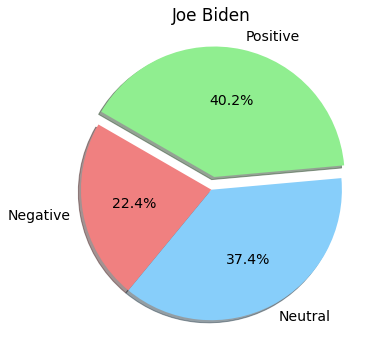

In [28]:
import matplotlib as mpl

plt.subplots(figsize=(10, 6))
plt.pie(biden_sentiment_percents,
    labels=["Negative", "Neutral", "Positive"],
    colors=["lightcoral", "lightskyblue", "lightgreen"],
    explode=[0, 0, 0.1],
    autopct='%1.1f%%',
    shadow=True, startangle=150)
plt.title("Joe Biden")

mpl.rcParams['font.size'] = 14

# Save pie chart
plt.savefig("Images/piechart_biden2.png")

# Show Figure
plt.show()

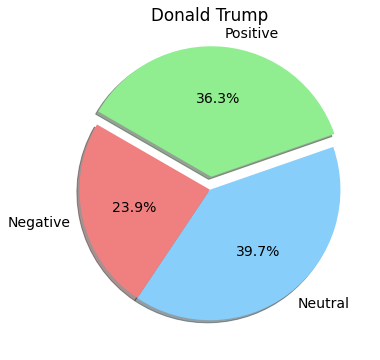

In [7]:
plt.subplots(figsize=(10, 6))
plt.pie(trump_sentiment_percents,
    labels=["Negative", "Neutral", "Positive"],
    colors=["lightcoral", "lightskyblue", "lightgreen"],
    explode=[0, 0, 0.1],
    autopct='%1.1f%%',
    shadow=True, startangle=150)
plt.title("Donald Trump")

mpl.rcParams['font.size'] = 14

# Save pie chart
plt.savefig("Images/piechart_trump2.png")

# Show Figure
plt.show()

### Word Cloud

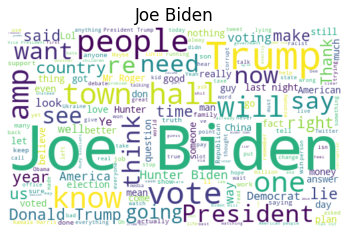

In [8]:
# Plotting a word cloud
# Import Dependencies
from wordcloud import WordCloud

allWordsBiden= ' '.join([twts for twts in biden_sentiment['tweet']])
wordCloud=WordCloud(width=500, height=300, random_state=21, background_color="rgba(255, 255, 255, 0)", max_font_size = 119).generate(allWordsBiden)
plt.imshow(wordCloud, interpolation='bilinear')
plt.axis('off')
plt.title('Joe Biden')

# Save Word cloud
plt.savefig("Images/wordcloud2_biden.png")

plt.show()

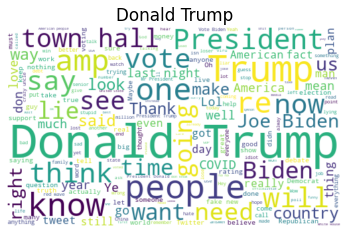

In [9]:
allWordsTrump= ' '.join([twts for twts in trump_sentiment['tweet']])
wordCloud=WordCloud(width=500, height=300, random_state=21, background_color="rgba(255, 255, 255, 0)", max_font_size = 119).generate(allWordsTrump)
plt.imshow(wordCloud, interpolation='bilinear')
plt.axis('off')
plt.title('Donald Trump')

# Save Word cloud
plt.savefig("Images/wordcloud2_trump.png")

plt.show()

In [10]:
# Import Dependencies
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import plotly.express as px
import hvplot.pandas

### Preprocessing Data 

In [20]:
# B = pd.get_dummies(biden_sentiment, columns=["Sentiment"]) # Dummify 'Sentiment' feature
# T = pd.get_dummies(trump_sentiment, columns=["Sentiment"])

In [11]:
biden_sentiment.drop(['tweet', 'candidate', 'Sentiment'], axis=1, inplace=True) # Dropping the 'tweet' column
trump_sentiment.drop(['tweet', 'candidate', 'Sentiment'], axis=1, inplace=True)

C:\Users\Greg\anaconda3\envs\PythonData\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [16]:
# X=X.rename(columns={"candidate_Trump": "candidate"}) # where 0=Biden and 1=Trump

### Plotting Elbow Curves

### Biden Elbow Curve

In [12]:
# Plotting Elbow Curve for Biden_Sentiments Data
inertia =[]
k = list(range(1, 11))

# Calculate the inertia for the range of K values
for i in k:
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(biden_sentiment)
    inertia.append(km.inertia_)
    
# Plotting Elbow Curve with hvPlot
elbow_data = {"k": k, "inertia": inertia}
df_elbow = pd.DataFrame(elbow_data)


df_elbow.hvplot.line(x="k", y="inertia", xticks=k, title="Elbow Curve - Biden")

:Curve   [k]   (inertia)

### Trump Elbow Curve

In [13]:
# Plotting Elbow Curve for Biden_Sentiments Data
inertia =[]
k = list(range(1, 11))

# Calculate the inertia for the range of K values
for i in k:
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(trump_sentiment)
    inertia.append(km.inertia_)
    
# Plotting Elbow Curve with hvPlot
elbow_data = {"k": k, "inertia": inertia}
df_elbow = pd.DataFrame(elbow_data)


df_elbow.hvplot.line(x="k", y="inertia", xticks=k, title="Elbow Curve - Trump")

:Curve   [k]   (inertia)

### Get Clusters Function

In [14]:
def get_clusters(k, data):
    
    # Creating a copy of 
    data = data.copy()
    
    # Initialize the K-Means model
    model = KMeans(n_clusters=k, random_state=0)
    
    # Fit the model
    model.fit(data)
    
    # Predict clusters
    predictions = model.predict(data)
    
    # Return DataFrame with predicted clusters
    data["class"] = model.labels_
    
    return data

### Biden Cluster Analysis

In [15]:
# From the elbow curve, testing for k = 3 or k = 4
biden_three_clusters = get_clusters(3, biden_sentiment)
biden_three_clusters.head()

,replies_count,retweets_count,likes_count,tweet_length,Subjectivity,Polarity,class
0,0,0,0,48,0.287500,0.215625,0
1,0,0,0,4,0.200000,0.100000,0
2,0,1,1,25,0.383333,-0.200000,0
3,0,0,0,17,0.305000,0.155000,0
4,0,0,3,10,0.000000,0.000000,0


In [16]:
biden_four_clusters = get_clusters(4, biden_sentiment)
biden_four_clusters.head()

,replies_count,retweets_count,likes_count,tweet_length,Subjectivity,Polarity,class
0,0,0,0,48,0.287500,0.215625,0
1,0,0,0,4,0.200000,0.100000,0
2,0,1,1,25,0.383333,-0.200000,0
3,0,0,0,17,0.305000,0.155000,0
4,0,0,3,10,0.000000,0.000000,0


In [51]:
biden_three_clusters.to_csv(r'C:\Users\Greg\Documents\Analysis_Projects\US_Election_NLP\US_Election_NLP\Concat_ML_Data\biden_three_clusters2D.csv', index = False, header=True)

### 2D Scatter Plot

In [40]:
# Plotting the 2D-Scatter with x="likes_count" and y="retweets_count" for K=3
biden_three_clusters.hvplot.scatter(x="likes_count", y="retweets_count", by="class")

:NdOverlay   [class]
   :Scatter   [likes_count]   (retweets_count)

In [41]:
# Plotting the 2D-Scatter with x="likes_count" and y="replies_count" for K=3
biden_three_clusters.hvplot.scatter(x="likes_count", y="replies_count", by="class")

:NdOverlay   [class]
   :Scatter   [likes_count]   (replies_count)

### Trump Cluster Analysis

In [17]:
# From the elbow curve, testing for  k = 3 and k = 4
trump_three_clusters = get_clusters(3, trump_sentiment)
trump_three_clusters.head()

,replies_count,retweets_count,likes_count,tweet_length,Subjectivity,Polarity,class
409794,0,0,3,2,0.000000,0.0000,0
409795,0,0,0,30,0.562500,0.3125,0
409796,0,1,1,25,0.383333,-0.2000,0
409797,0,0,0,14,0.400000,-0.2000,0
409798,0,0,0,3,0.400000,-0.2000,0


In [18]:
trump_four_clusters = get_clusters(4, trump_sentiment)
trump_four_clusters.head()

,replies_count,retweets_count,likes_count,tweet_length,Subjectivity,Polarity,class
409794,0,0,3,2,0.000000,0.0000,0
409795,0,0,0,30,0.562500,0.3125,0
409796,0,1,1,25,0.383333,-0.2000,0
409797,0,0,0,14,0.400000,-0.2000,0
409798,0,0,0,3,0.400000,-0.2000,0


In [53]:
trump_three_clusters.to_csv(r'C:\Users\Greg\Documents\Analysis_Projects\US_Election_NLP\US_Election_NLP\Concat_ML_Data\trump_three_clusters2D.csv', index = False, header=True)

### 2D Scatter Plot

In [19]:
# Plotting the 2D-Scatter with x="likes_count" and y="retweets_count" for K=3
trump_three_clusters.hvplot.scatter(x="likes_count", y="retweets_count", by="class")

:NdOverlay   [class]
   :Scatter   [likes_count]   (retweets_count)

In [20]:
# Plotting the 2D-Scatter with x="likes_count" and y="retweets_count" for K=3
trump_three_clusters.hvplot.scatter(x="likes_count", y="replies_count", by="class")

:NdOverlay   [class]
   :Scatter   [likes_count]   (replies_count)